# Preference Learning - Part III
## 1. Groups' Price Responsiveness - K-mean based

In [1]:
%matplotlib inline
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import json
import seaborn as sns
import math
from pandas.io.json import json_normalize #package for flattening json in pandas df
import matplotlib.pyplot as plt
from datetime import date, timedelta, datetime

In [ ]:
# Import all preprocessed data necessary for the analysis
df_tou1h = pd.read_csv("C:\\Users\\Rockwell\\Desktop\\Paper4\\data_collection\\data_tables\\Consumption_tou2013_1h.csv")
df_Ntou1h = pd.read_csv("C:\\Users\\Rockwell\\Desktop\\Paper4\\data_collection\\data_tables\\Consumption_Ntou2013_1h.csv")
df_wea1h = pd.read_csv("C:\\Users\\Rockwell\\Desktop\\Paper4\\data_collection\\weather\\LondonWeather2013_interpolated.csv")
df_tariff_1h = pd.read_csv("C:\\Users\\Rockwell\\Desktop\\Paper4\\data_collection\\data_tables\\df_tariff_1h.csv")

In [2]:
import os
os.getcwd()

'/Users/Rockwell/Documents/GitHub/Demand-Response'

In [3]:
# for ios system, import all data necessary for the analysis
df_tou1h = pd.read_csv('/Users/Rockwell/Desktop/PhD/Paper4PreferenceLearning/data/Consumption_tou2013_1h.csv')
df_Ntou1h = pd.read_csv('/Users/Rockwell/Desktop/PhD/Paper4PreferenceLearning/data/Consumption_Ntou2013_1h.csv')
df_wea1h = pd.read_csv('/Users/Rockwell/Desktop/PhD/Paper4PreferenceLearning/data/LondonWeather2013_interpolated.csv')
df_tariff_1h = pd.read_csv('/Users/Rockwell/Desktop/PhD/Paper4PreferenceLearning/data/df_tariff_1h.csv')

In [4]:
# first, create a list of days that belongs to event days
event_days = set()
event_series = df_tariff_1h[df_tariff_1h.Event_tags.notnull()].GMT
for i in event_series:
    event_days.add(datetime.strptime(i[:10], "%Y-%m-%d" ).date()) # add all event dates to the set
df_help = pd.DataFrame(pd.to_datetime(df_tariff_1h.GMT).dt.date) #str to datatime and extract date then make it to dataframe
# df_help[df_help['GMT'].isin(event_days)] #this shows the event days
# we can use ~df_help['GMT'].isin(event_days) to generate any non-flexible period items

# create TOU and non-TOU demand data in non-flexible hours
df_wea1h_nf = df_wea1h[~df_help['GMT'].isin(event_days)]
df_Ntou1h_nf = df_Ntou1h[~df_help['GMT'].isin(event_days)]
df_tou1h_nf = df_tou1h[~df_help['GMT'].isin(event_days)]

# create event data
df_tariff_1h_event = df_tariff_1h[df_tariff_1h.GMT.isin(event_series)]
df_wea1h_event = df_wea1h[df_wea1h.GMT.isin(event_series)]
df_tou1h_event = df_tou1h[df_tou1h.GMT.isin(event_series)]

In [5]:
# seperate the above data set based on the seasonal effect
# i.e., months of 11, 12, 1, 2, 3 are in a group - cold season
# months of 4, 5, 6, 7, 8, 9, 10 are in another group - warm season
cold_season = [11, 12, 1, 2, 3]
warm_season = [4, 5, 6, 7, 8, 9, 10]
df_help_season = pd.DataFrame(pd.to_datetime(df_wea1h_nf.GMT).dt.month)
df_wea1h_nf_cold = df_wea1h_nf[df_help_season['GMT'].isin(cold_season)]
df_wea1h_nf_warm = df_wea1h_nf[df_help_season['GMT'].isin(warm_season)]
df_Ntou1h_nf_cold = df_Ntou1h_nf[df_help_season['GMT'].isin(cold_season)]
df_Ntou1h_nf_warm = df_Ntou1h_nf[df_help_season['GMT'].isin(warm_season)]
df_tou1h_nf_cold = df_tou1h_nf[df_help_season['GMT'].isin(cold_season)]
df_tou1h_nf_warm = df_tou1h_nf[df_help_season['GMT'].isin(warm_season)]

df_help_season_event = pd.DataFrame(pd.to_datetime(df_wea1h_event.GMT).dt.month)
df_wea1h_event_cold = df_wea1h_event[df_help_season_event['GMT'].isin(cold_season)]
df_wea1h_event_warm = df_wea1h_event[df_help_season_event['GMT'].isin(warm_season)]
df_tou1h_event_cold = df_tou1h_event[df_help_season_event['GMT'].isin(cold_season)]
df_tou1h_event_warm = df_tou1h_event[df_help_season_event['GMT'].isin(warm_season)]
df_tariff_1h_event_cold = df_tariff_1h_event[df_help_season_event['GMT'].isin(cold_season)]
df_tariff_1h_event_warm = df_tariff_1h_event[df_help_season_event['GMT'].isin(warm_season)]

## 1. Groups' Price Responsiveness - K-mean based

The way we analyze the group price responsiveness has three steps:

1) for each hosehold group, build a new dataframe, the first column is GMT, the next columns are user ids in the group, the next column is temperature, then the price, day of a week, hour of a day, then the predicted consumption, and last the price responsiveness

2) build a function that can generate predicted consumption based on the day of a week, temp, hour to choose the coefficients and then make a prediction.

3) plot the properties based on from the smallest unit (day of week, hour, temp) to (day of week, hour), (day of week, temp), (hour, temp), (day of week), (hour), (temp) so we will have very comprehensive price responsiveness of three different groups


In [6]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D 
n = 3 # cluster numbers
n_house = 1025 # total household numbers
houseLabel = [] # store the 24hour group labels for each hoursehold
for i in range(1025):
    houseLabel.append('')
houseLabel = np.array(houseLabel)
cons_type = ['High Consumption', 'Medium Consumption', 'Low Consumption']
fig_all = plt.figure(figsize = (13,90))
for i in range(24):
    if i <= 9:
        x = df_tou1h_nf_cold[df_tou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.fillna(x.mean()).transpose() # data for the specific hour, and fill in null value with mean
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n, init='k-means++').fit(principleDf_nstd.iloc[:,:3])
        houseLabel = np.core.defchararray.add(houseLabel, kmeans.labels_.astype('str'))
    else:
        x = df_tou1h_nf_cold[df_tou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.fillna(x.mean()).transpose() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n, init='k-means++').fit(principleDf_nstd.iloc[:,:3])
        cluster_dict = {}
        houseLabel = np.core.defchararray.add(houseLabel, kmeans.labels_.astype('str'))
# We obtain the house Label shown below
# print(houseLabel)

# Group the house based on their 24 hour labels
houseLableDf = pd.DataFrame()
houseLableDf['House'] = df_tou1h_nf_cold.columns[1:]
houseLableDf['Label'] = houseLabel
houseGroupDf = houseLableDf.groupby('Label').size().reset_index(name='counts')
houseGroupDf = houseGroupDf.sort_values(by=['counts'], ascending=False)
houseGroupDf

,Label,counts
130,000000010121102211100000,390
132,000000010121102211102000,35
135,000000010121102211200000,28
136,000000010121102211202000,22
48,000000010101102211100000,20
127,000000010121102210100000,18
123,000000010121102011100000,16
70,000000010102011011100000,12
157,000000010121112211100000,12
68,000000010102011010100000,11


<Figure size 936x6480 with 0 Axes>

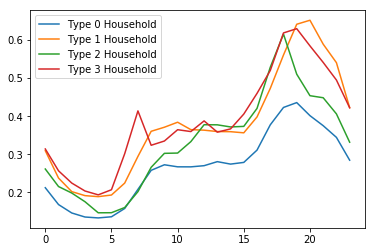

In [7]:
for i in range(4):
    load = []
    for j in range(24):
        if j <= 9:
            x = df_tou1h_nf_cold[df_tou1h_nf_cold.GMT.str.contains('0' + str(j) + ':00:00')]
            x.set_index('GMT', inplace = True)
            x = x.fillna(x.mean())
            x = x[list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[i]].House)]
            load.append(x.mean().mean())
        else:
            x = df_tou1h_nf_cold[df_tou1h_nf_cold.GMT.str.contains(str(j) + ':00:00')]
            x.set_index('GMT', inplace = True)
            x = x.fillna(x.mean())
            x = x[list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[i]].House)]
            load.append(x.mean().mean())
    plt.plot(load, label = 'Type ' + str(i) + ' Household')
plt.legend()
plt.show()

In [8]:
# Type 0 household
# build a new dataframe with columns: GMT, user ids in the group
df_type0 = df_tou1h_event_cold[['GMT'] + list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[0]].House)]
df_type0 = pd.merge(df_type0, df_wea1h_event_cold, on = 'GMT') # add weather
df_type0 = pd.merge(df_type0, df_tariff_1h_event_cold, on = 'GMT') # add price
df_type0['Day of week'] = pd.to_datetime(df_type0.GMT).dt.dayofweek # add day of week
df_type0['Hour of day'] = pd.to_datetime(df_type0.GMT).dt.hour # add hour of day
df_type0['Household type'] = 0

# Type 1 household
# build a new dataframe with columns: GMT, user ids in the group
df_type1 = df_tou1h_event_cold[['GMT'] + list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[1]].House)]
df_type1 = pd.merge(df_type1, df_wea1h_event_cold, on = 'GMT') # add weather
df_type1 = pd.merge(df_type1, df_tariff_1h_event_cold, on = 'GMT') # add price
df_type1['Day of week'] = pd.to_datetime(df_type1.GMT).dt.dayofweek # add day of week
df_type1['Hour of day'] = pd.to_datetime(df_type1.GMT).dt.hour # add hour of day
df_type1['Household type'] = 1

# Type 2 household
# build a new dataframe with columns: GMT, user ids in the group
df_type2 = df_tou1h_event_cold[['GMT'] + list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[2]].House)]
df_type2 = pd.merge(df_type2, df_wea1h_event_cold, on = 'GMT') # add weather
df_type2 = pd.merge(df_type2, df_tariff_1h_event_cold, on = 'GMT') # add price
df_type2['Day of week'] = pd.to_datetime(df_type2.GMT).dt.dayofweek # add day of week
df_type2['Hour of day'] = pd.to_datetime(df_type2.GMT).dt.hour # add hour of day
df_type2['Household type'] = 2

With the household type and feature data ready, we need to build functions that can predict the consumptions during these time periods. Since we are considering group properties, the above users are all in the first group, for each time period, we only have one consumption predicted for the whole group, but since the regression coefficients depend on day of week, temperature and hour of day, so it should be quite different for different time.

In [9]:
def predict(dfRegression, dayOfWeek, hour, temperature):
    '''
    Predict the consumption duruing event time based on 
    the regression, day of week, hour of a day and temperature
    '''
    weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    output = dfRegression[weeks[dayOfWeek]].iloc[hour](temperature)
    return output

In [10]:
# store the regression coefficients
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_regression_0 = {} # store the regression coefficients
df_regression_1 = {}
df_regression_2 = {}
# df_regression_3 = {}
lm = LinearRegression()
for g in range(3): # doing this for three groups
    for day_of_week in range(7):
        coef_temp = []
        for i in range(24):
            if i <= 9:
                z = df_tou1h_nf_cold[df_tou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
                y_temp = z[['GMT'] + list(houseLableDf[(houseLableDf.Label == houseGroupDf.Label.iloc[g]) ].House)]
                y = y_temp[pd.to_datetime(z.GMT).dt.dayofweek == day_of_week] # find the users' data for Monday
                y.set_index('GMT', inplace = True)
                y = y.fillna(y.mean()).values
                y = np.reshape(y, y.shape[0] * y.shape[1], order = 'F') # reconstruct the y variable
                x = df_wea1h_nf_cold.TempC[(df_wea1h.GMT.str.contains('0' + str(i) + ':00:00')) & (pd.to_datetime(z.GMT).dt.dayofweek == day_of_week)].values
                x = np.tile(x, reps = sum(houseLableDf.Label == houseGroupDf.Label.iloc[g])) # reconstruct the x variable
                z = np.polyfit(x, y, 2)
                p = np.poly1d(z)
                coef_temp.append(p)
            else:
                z = df_tou1h_nf_cold[df_tou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
                y_temp = z[['GMT'] + list(houseLableDf[(houseLableDf.Label == houseGroupDf.Label.iloc[g]) ].House)]
                y = y_temp[pd.to_datetime(z.GMT).dt.dayofweek == day_of_week] # find the users' data for Monday
                y.set_index('GMT', inplace = True)
                y = y.fillna(y.mean()).values
                y = np.reshape(y, y.shape[0] * y.shape[1], order = 'F') # reconstruct the y variable

                x = df_wea1h_nf_cold.TempC[(df_wea1h.GMT.str.contains(str(i) + ':00:00')) & (pd.to_datetime(z.GMT).dt.dayofweek == day_of_week)].values
                x = np.tile(x, reps = sum(houseLableDf.Label == houseGroupDf.Label.iloc[g])) # reconstruct the x variable
                z = np.polyfit(x, y, 2)
                p = np.poly1d(z)
                coef_temp.append(p)
        if g == 0:
            df_regression_0[weeks[day_of_week]] = coef_temp
        elif g == 1:
            df_regression_1[weeks[day_of_week]] = coef_temp
        else:
            df_regression_2[weeks[day_of_week]] = coef_temp
df_regression_0 = pd.DataFrame(df_regression_0) # type 0 regression coefficient
df_regression_1 = pd.DataFrame(df_regression_1) # type 1 
df_regression_2 = pd.DataFrame(df_regression_2) # type 2 

In [11]:
# type 0 event time consumption prediction
pred_result = []
for i in range(df_type0.shape[0]):
    pred_result.append(predict(df_regression_0, df_type0['Day of week'].iloc[i], df_type0['Hour of day'].iloc[i], df_type0['TempC'].iloc[i]))
df_type0['Predicted consumption'] = pred_result
# price responsiveness elementwise
df_type0_res = df_type0.copy()
df_type0_res.iloc[:,1:houseGroupDf.counts.iloc[0] + 1] = df_type0.iloc[:,1:houseGroupDf.counts.iloc[0] + 1].sub(df_type0['Predicted consumption'], axis = 0)

# type 1 event time consumption prediction
pred_result = []
for i in range(df_type1.shape[0]):
    pred_result.append(predict(df_regression_1, df_type1['Day of week'].iloc[i], df_type1['Hour of day'].iloc[i], df_type1['TempC'].iloc[i]))
df_type1['Predicted consumption'] = pred_result

# price responsiveness elementwise
df_type1_res = df_type1.copy()
df_type1_res.iloc[:,1:houseGroupDf.counts.iloc[1] + 1] = df_type1.iloc[:,1:houseGroupDf.counts.iloc[1] + 1].sub(df_type1['Predicted consumption'], axis = 0)

# type 2 event time consumption prediction
pred_result = []
for i in range(df_type2.shape[0]):
    pred_result.append(predict(df_regression_2, df_type2['Day of week'].iloc[i], df_type2['Hour of day'].iloc[i], df_type2['TempC'].iloc[i]))
df_type2['Predicted consumption'] = pred_result

# price responsiveness elementwise
df_type2_res = df_type2.copy()
df_type2_res.iloc[:,1:houseGroupDf.counts.iloc[2] + 1] = df_type2.iloc[:,1:houseGroupDf.counts.iloc[2] + 1].sub(df_type2['Predicted consumption'], axis = 0)

To visualize the price responsiveness, we need to reformat the data and melt them to a long dataframe, and all the user ID columns will be extracted to form a individual dataframe with adding household group label and we concatenate all of them in a long dataframe.

In [13]:
houseGroupDf.counts.iloc[0]

407

In [14]:
df_type0_res.head()

,GMT,D0000,D0001,D0005,D0007,D0010,D0012,D0013,D0016,D0018,...,D1023,D1024,TempC,TempF,Price,Event_tags,Day of week,Hour of day,Household type,Predicted consumption
0,2013-01-04 14:00:00,-0.085446,0.051554,0.004554,-0.039446,-0.169446,0.404554,0.065554,-0.118446,-0.100446,...,-0.174446,-0.055446,10.333333,51.000000,0.0399,L3,4,14,0,0.187446
1,2013-01-04 15:00:00,-0.095975,0.823025,0.451025,-0.040975,-0.162975,0.836025,0.735025,-0.130975,0.168025,...,-0.160975,-0.105975,10.000000,51.000000,0.0399,L3,4,15,0,0.192975
2,2013-01-04 16:00:00,1.131656,0.084656,0.314656,0.365656,-0.203344,0.553656,0.507656,-0.173344,0.404656,...,-0.004344,-0.043344,9.333333,49.333333,0.0399,L3,4,16,0,0.229344
3,2013-01-07 23:00:00,0.092168,0.122168,0.077168,0.034168,-0.195832,0.347168,-0.102832,-0.124832,0.303168,...,-0.095832,0.245168,7.000000,44.000000,0.6720,H3,0,23,0,0.221832
4,2013-01-08 00:00:00,-0.066635,0.064365,0.112365,0.104365,-0.140635,0.043365,-0.061635,-0.094635,0.009365,...,-0.059635,-0.015635,7.000000,44.000000,0.6720,H3,1,0,0,0.164635


In [15]:
df_type0_res

,GMT,D0000,D0001,D0005,D0007,D0010,D0012,D0013,D0016,D0018,...,D1023,D1024,TempC,TempF,Price,Event_tags,Day of week,Hour of day,Household type,Predicted consumption
0,2013-01-04 14:00:00,-0.085446,0.051554,0.004554,-0.039446,-0.169446,0.404554,0.065554,-0.118446,-0.100446,...,-0.174446,-0.055446,10.333333,51.000000,0.0399,L3,4,14,0,0.187446
1,2013-01-04 15:00:00,-0.095975,0.823025,0.451025,-0.040975,-0.162975,0.836025,0.735025,-0.130975,0.168025,...,-0.160975,-0.105975,10.000000,51.000000,0.0399,L3,4,15,0,0.192975
2,2013-01-04 16:00:00,1.131656,0.084656,0.314656,0.365656,-0.203344,0.553656,0.507656,-0.173344,0.404656,...,-0.004344,-0.043344,9.333333,49.333333,0.0399,L3,4,16,0,0.229344
3,2013-01-07 23:00:00,0.092168,0.122168,0.077168,0.034168,-0.195832,0.347168,-0.102832,-0.124832,0.303168,...,-0.095832,0.245168,7.000000,44.000000,0.6720,H3,0,23,0,0.221832
4,2013-01-08 00:00:00,-0.066635,0.064365,0.112365,0.104365,-0.140635,0.043365,-0.061635,-0.094635,0.009365,...,-0.059635,-0.015635,7.000000,44.000000,0.6720,H3,1,0,0,0.164635
5,2013-01-08 01:00:00,-0.033712,0.034288,0.060288,0.041288,-0.100712,0.019288,-0.028712,-0.065712,-0.034712,...,-0.000712,0.006288,6.666667,43.333333,0.6720,H3,1,1,0,0.132712
6,2013-01-10 02:00:00,-0.015063,0.008937,0.728937,0.061937,-0.089063,-0.013063,-0.012063,-0.040063,-0.040063,...,-0.081063,0.115937,1.333333,34.333333,0.0399,L3,3,2,0,0.112063
7,2013-01-10 03:00:00,-0.015244,0.003756,0.382756,0.052756,-0.082244,-0.017244,-0.021244,-0.040244,-0.019244,...,-0.096244,0.086756,1.000000,34.000000,0.0399,L3,3,3,0,0.110244
8,2013-01-10 04:00:00,0.113174,-0.032826,0.199174,0.094174,-0.086826,0.088174,0.000174,-0.036826,-0.051826,...,-0.049826,0.077174,1.000000,34.333333,0.0399,L3,3,4,0,0.106826
9,2013-01-11 11:00:00,-0.099746,-0.005746,0.012254,0.117254,-0.184746,-0.099746,-0.048746,-0.133746,-0.103746,...,-0.027746,-0.047746,2.666667,36.666667,0.6720,H3,4,11,0,0.204746


In [12]:
# select each user ID and form a seperate dataframe
# first change all the user ID to "Consumption"
new_col = ['GMT']
for i in range(0, houseGroupDf.counts.iloc[0]):
    new_col.append('Consumption')
new_col = new_col + list(df_type0_res.columns)[-8:] # the new column names
df_type0_res.columns = new_col
df_all_res_long = pd.DataFrame()
for i in range(1, houseGroupDf.counts.iloc[0] + 1):
    df_all_res_long = df_all_res_long.append(df_type0_res.iloc[:,[0,i,-8,-7,-6,-5,-4,-3,-2,-1]], ignore_index = True)

new_col = ['GMT']
for i in range(0, houseGroupDf.counts.iloc[1]): # for renaming the second type
    new_col.append('Consumption')
new_col = new_col + list(df_type1_res.columns)[-8:] # the new column names
df_type1_res.columns = new_col
for i in range(1, houseGroupDf.counts.iloc[1] + 1):
    df_all_res_long = df_all_res_long.append(df_type1_res.iloc[:,[0,i,-8,-7,-6,-5,-4,-3,-2,-1]], ignore_index = True)

new_col = ['GMT']
for i in range(0, houseGroupDf.counts.iloc[2]): # for renaming the third type
    new_col.append('Consumption')
new_col = new_col + list(df_type2_res.columns)[-8:] # the new column names
df_type2_res.columns = new_col
for i in range(1, houseGroupDf.counts.iloc[2] + 1):
    df_all_res_long = df_all_res_long.append(df_type2_res.iloc[:,[0,i,-8,-7,-6,-5,-4,-3,-2,-1]], ignore_index = True)

# for clearer visulization, round the temperatures
df_all_res_long['TempC'] = df_all_res_long.TempC.round(0)
df_all_res_long['TempF'] = df_all_res_long.TempF.round(0)
df_all_res_long # ready for the price responsiveness analysis

,GMT,Consumption,TempC,TempF,Price,Event_tags,Day of week,Hour of day,Household type,Predicted consumption
0,2013-01-04 14:00:00,-0.166903,10.0,51.0,0.0399,L3,4,14,0,0.268903
1,2013-01-04 15:00:00,-0.172093,10.0,51.0,0.0399,L3,4,15,0,0.269093
2,2013-01-04 16:00:00,1.055422,9.0,49.0,0.0399,L3,4,16,0,0.305578
3,2013-01-07 23:00:00,0.033240,7.0,44.0,0.6720,H3,0,23,0,0.280760
4,2013-01-08 00:00:00,-0.113005,7.0,44.0,0.6720,H3,1,0,0,0.211005
5,2013-01-08 01:00:00,-0.074577,7.0,43.0,0.6720,H3,1,1,0,0.173577
6,2013-01-10 02:00:00,-0.049245,1.0,34.0,0.0399,L3,3,2,0,0.146245
7,2013-01-10 03:00:00,-0.042969,1.0,34.0,0.0399,L3,3,3,0,0.137969
8,2013-01-10 04:00:00,0.081876,1.0,34.0,0.0399,L3,3,4,0,0.138124
9,2013-01-11 11:00:00,-0.174120,3.0,37.0,0.6720,H3,4,11,0,0.279120


Then plot the properties based on from the smallest unit (day of week, hour, temp) to (day of week, hour), (day of week, temp), (hour, temp), (day of week), (hour), (temp) for different prices (high and low) so we will have very comprehensive price responsiveness of three different groups

a) Day of week - hour - temperature : prices

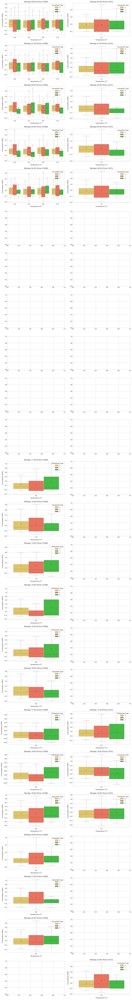

In [13]:
# Monday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 0 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for p in range(2): # two price levels
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 2, 2 * i + (p + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Price'] == prices[p])]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Price ' + str(prices[p]) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)    
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Price ' + str(prices[p]) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5) 
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
plt.tight_layout()

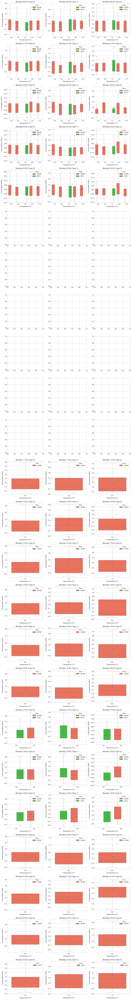

In [14]:
# Price comparison version
# Monday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 0 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for g in range(3): # three types
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 3, 3 * i + (g + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Household type'] == g)]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Type ' + str(g) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)    
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Type ' + str(g) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5) 
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
plt.tight_layout()

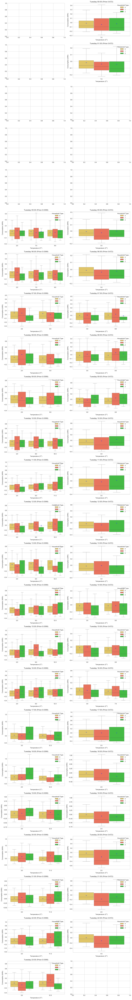

In [15]:
# Tuesday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 1 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for p in range(2): # two price levels
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 2, 2 * i + (p + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Price'] == prices[p])]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Price ' + str(prices[p]) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)    
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Price ' + str(prices[p]) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
plt.tight_layout()

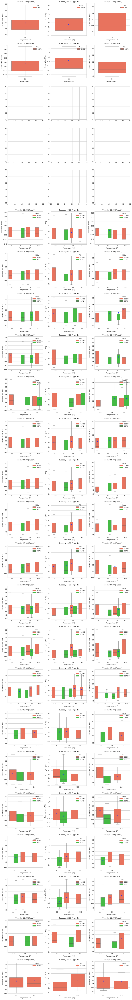

In [16]:
# Price comparison
# Tuesday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 1 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for g in range(3): # three types
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 3, 3* i + (g + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Household type'] == g)]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Type ' + str(g) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)    
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Type ' + str(g) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
plt.tight_layout()

See type0 at 6pm and 7pm mean values. We find type 0 households are actually good candidates for demand response, since they have a right direction of energy usage change. But for type 1, their response sometimes fluctuates.

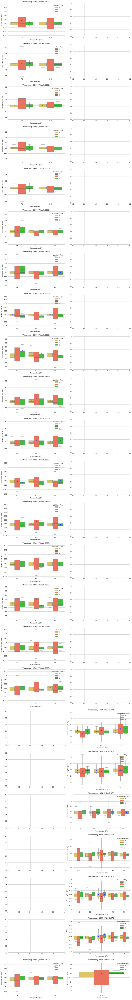

In [99]:
# Wednesday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 2 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for p in range(2): # two price levels
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 2, 2 * i + (p + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Price'] == prices[p])]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Price ' + str(prices[p]) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)  
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')       
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Price ' + str(prices[p]) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
plt.tight_layout()

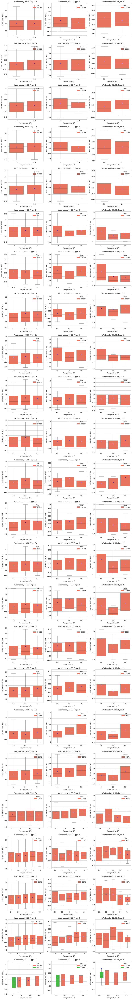

In [130]:
# price comparison
# Wednesday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 2 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for g in range(3): # three types
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 3, 3* i + (g + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Household type'] == g)]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Type ' + str(g) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)  
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')       
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Type ' + str(g) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
plt.tight_layout()

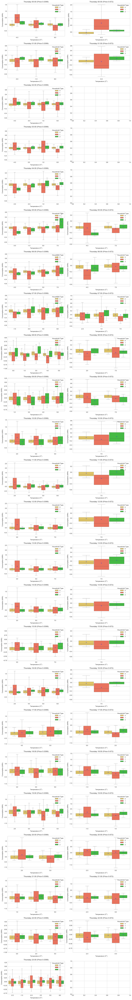

In [100]:
# Thursday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 3 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for p in range(2): # two price levels
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 2, 2 * i + (p + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Price'] == prices[p])]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Price ' + str(prices[p]) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)        
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')   
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Price ' + str(prices[p]) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
plt.tight_layout()

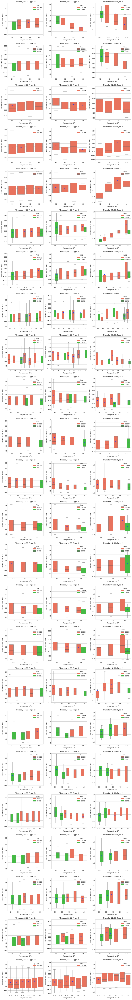

In [131]:
# price comparison
# Thursday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 3 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for g in range(3): # three types
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 3, 3* i + (g + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Household type'] == g)]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Type ' + str(g) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)        
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')   
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Type ' + str(g) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
plt.tight_layout()

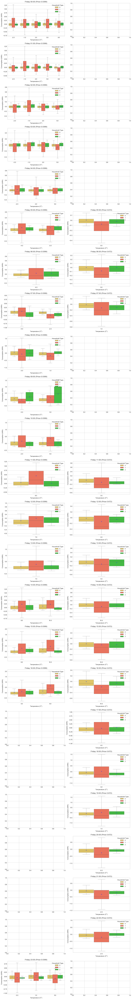

In [101]:
# Friday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 4 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for p in range(2): # two price levels
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 2, 2 * i + (p + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Price'] == prices[p])]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers=False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Price ' + str(prices[p]) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')      
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers=False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Price ' + str(prices[p]) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
plt.tight_layout()

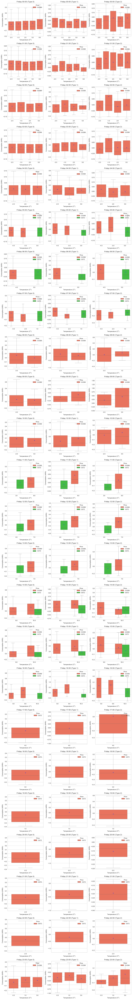

In [132]:
# price comparison
# Friday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 4 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for g in range(3): # three types
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 3, 3* i + (g + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Household type'] == g)]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers=False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Type ' + str(g) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')      
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers=False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Type ' + str(g) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
plt.tight_layout()

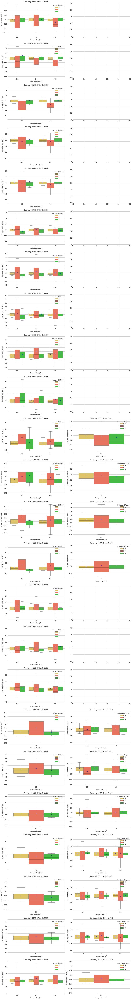

In [102]:
# Saturday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 5 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for p in range(2): # two price levels
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 2, 2 * i + (p + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Price'] == prices[p])]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Price ' + str(prices[p]) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')      
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Price ' + str(prices[p]) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
plt.tight_layout()

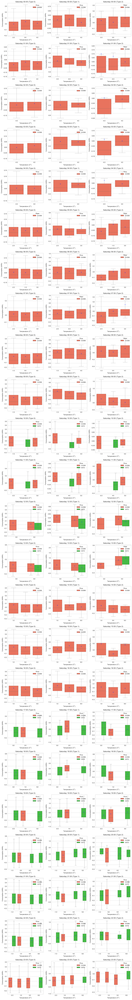

In [133]:
# price comparison
# Saturday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 5 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for g in range(3): # three types
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 3, 3* i + (g + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Household type'] == g)]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Type ' + str(g) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')      
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Type ' + str(g) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
plt.tight_layout()

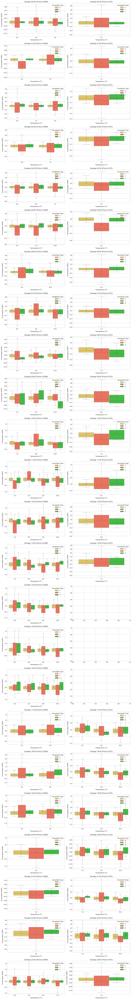

In [103]:
# Sunday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 6 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for p in range(2): # two price levels
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 2, 2 * i + (p + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Price'] == prices[p])]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Price ' + str(prices[p]) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)    
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')       
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Price ' + str(prices[p]) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Household Type')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
plt.tight_layout()

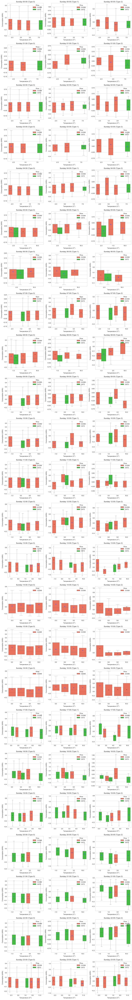

In [134]:
# price comparison
# Sunday hourly price responsiveness with different temperature and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
day_of_week = 6 # 0 is Monday, 6 is Sunday
df_day = df_all_res_long[df_all_res_long['Day of week'] == day_of_week]
for g in range(3): # three types
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 3, 3* i + (g + 1)))
        df_day_hour = df_day[(df_day['Hour of day'] == i) & (df_day['Household type'] == g)]
        if df_day_hour.shape[0] >= 1:
            if i <= 9:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' 0' + str(i) + ':00 (Type ' + str(g) + ')' )
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)    
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')       
            else:
                sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
                ax_Ntou[-1].set_title(weeks[day_of_week] + ' ' + str(i) + ':00 (Type ' + str(g) + ')')
                ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
                ax_Ntou[-1].set_ylabel('Consumption (kWh)')
                l = ax_Ntou[-1].legend()
                l.set_title('Price')
                for i,artist in enumerate(ax_Ntou[-1].artists):
                    artist.set_linewidth(0.5)
                    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                    # Loop over them here, and use the same colour as above
                    for j in range(i*6,i*6+6):
                        line = ax_Ntou[-1].lines[j]
                        line.set_linewidth(0.5)     
                ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
plt.tight_layout()

type2 may not be a good candidate for DR; type0 and type1 are good candidates but the program design must pay attention to the temperature impact on the demand responsiveness, we can expect with the same temperature, lower price would increase the consumption, higher price would decrease consumption, but this may not be true in different temperature situations. Conclusion: demand response plan must consider temperature impact, i.e., differentiated based on temperature situations instead of use a unified demand response plan for all temperatures.

b) Day of week - hour : prices

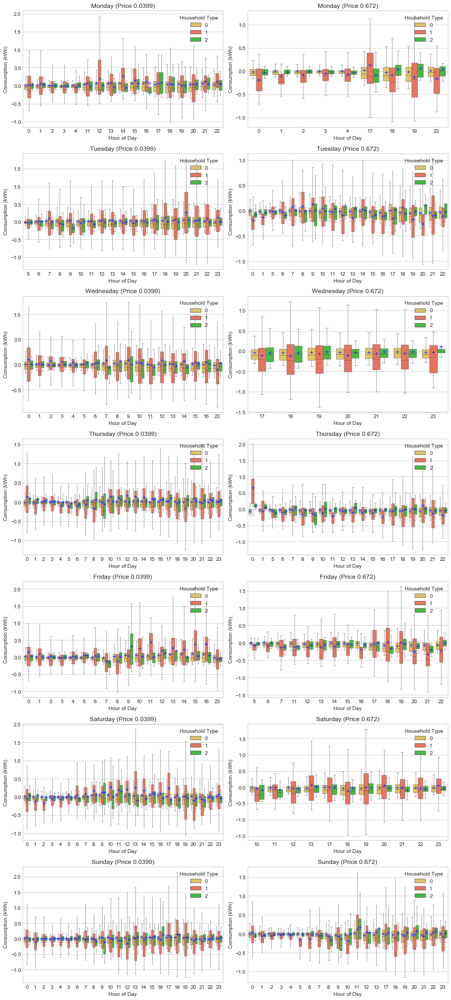

In [120]:
# hourly price responsiveness over days of week and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
for p in range(2): # two price levels
    for day_of_week in range(7):
        ax_Ntou.append(fig_all.add_subplot(24, 2, 2 * day_of_week + (p + 1)))
        df_day = df_all_res_long[(df_all_res_long['Day of week'] == day_of_week) & (df_all_res_long['Price'] == prices[p])]
        if df_day.shape[0] >= 1:
            sns.boxplot(x="Hour of day", y="Consumption", hue="Household type", data=df_day, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
            ax_Ntou[-1].set_title(weeks[day_of_week]  + ' (Price ' + str(prices[p]) + ')' )
            ax_Ntou[-1].set_xlabel(r'Hour of Day')
            ax_Ntou[-1].set_ylabel('Consumption (kWh)')
            l = ax_Ntou[-1].legend()
            l.set_title('Household Type')
            for i,artist in enumerate(ax_Ntou[-1].artists):
                artist.set_linewidth(0.5)
                # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                # Loop over them here, and use the same colour as above
                for j in range(i*6,i*6+6):
                    line = ax_Ntou[-1].lines[j]
                    line.set_linewidth(0.5)    
            ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
plt.tight_layout()

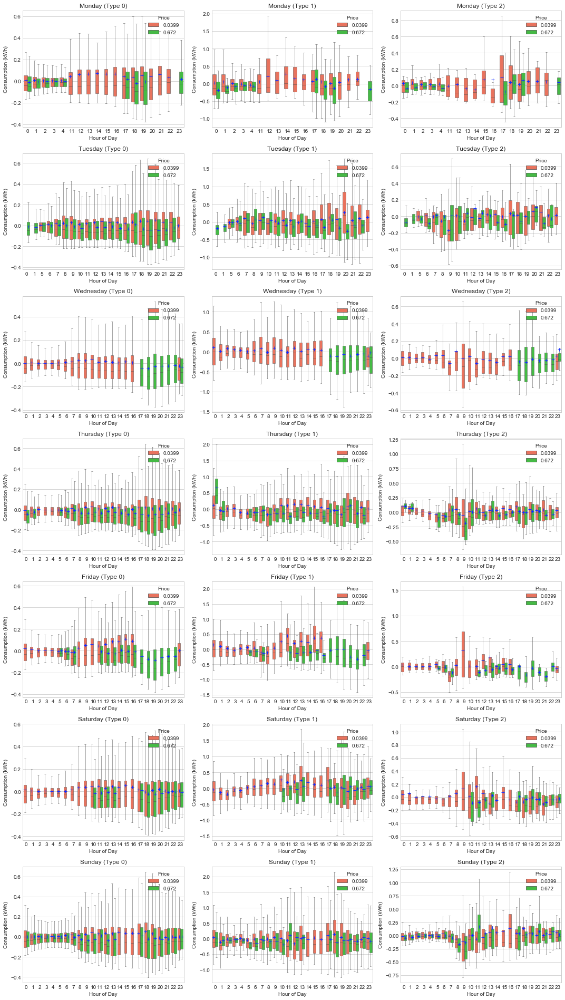

In [138]:
# price comparison
# hourly price responsiveness over days of week and prices
fig_all = plt.figure(figsize = (15,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
for g in range(3): # three types
    for day_of_week in range(7):
        ax_Ntou.append(fig_all.add_subplot(24, 3, 3 * day_of_week + (g + 1)))
        df_day = df_all_res_long[(df_all_res_long['Day of week'] == day_of_week) & (df_all_res_long['Household type'] == g)]
        if df_day.shape[0] >= 1:
            sns.boxplot(x="Hour of day", y="Consumption", hue="Price", data=df_day, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
            ax_Ntou[-1].set_title(weeks[day_of_week]  + ' (Type ' + str(g) + ')' )
            ax_Ntou[-1].set_xlabel(r'Hour of Day')
            ax_Ntou[-1].set_ylabel('Consumption (kWh)')
            l = ax_Ntou[-1].legend()
            l.set_title('Price')
            for i,artist in enumerate(ax_Ntou[-1].artists):
                artist.set_linewidth(0.5)
                # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                # Loop over them here, and use the same colour as above
                for j in range(i*6,i*6+6):
                    line = ax_Ntou[-1].lines[j]
                    line.set_linewidth(0.5)    
            ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
plt.tight_layout()

Friday night, Saturday night and Sunday night show an intersting pattern: on Friday night, people's price responsiveness increases, but on Saturday night, the price responstiveness become negative to low price meaning people simply use less energy even though it's a cheaper electricity price time period; Last on Sunday night, the price responsiveness recover to the balanced point.

c) Day of week - temperature : prices

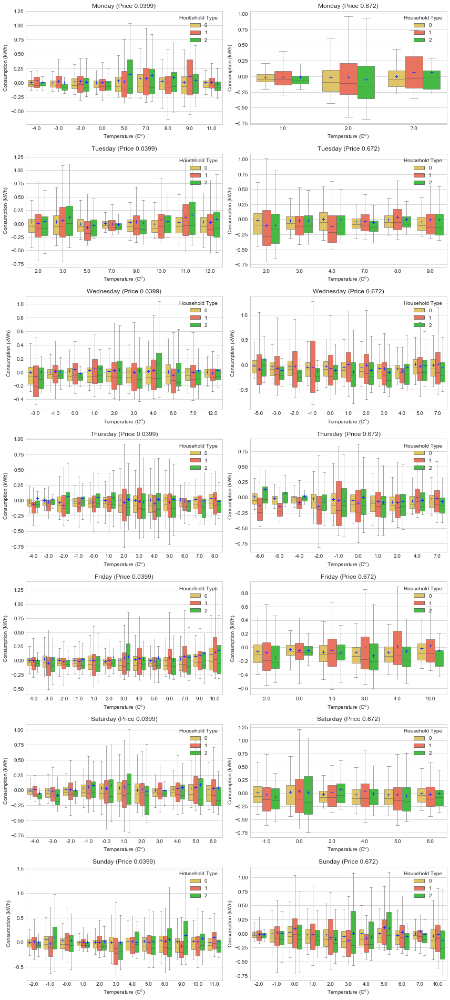

In [17]:
# price responsiveness under different tempertures over days of week and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
for p in range(2): # two price levels
    for day_of_week in range(7):
        ax_Ntou.append(fig_all.add_subplot(24, 2, 2 * day_of_week + (p + 1)))
        df_day = df_all_res_long[(df_all_res_long['Day of week'] == day_of_week) & (df_all_res_long['Price'] == prices[p])]
        if df_day.shape[0] >= 1:
            sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_day, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
            ax_Ntou[-1].set_title(weeks[day_of_week]  + ' (Price ' + str(prices[p]) + ')' )
            ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
            ax_Ntou[-1].set_ylabel('Consumption (kWh)')
            l = ax_Ntou[-1].legend()
            l.set_title('Household Type')
            for i,artist in enumerate(ax_Ntou[-1].artists):
                artist.set_linewidth(0.5)
                # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                # Loop over them here, and use the same colour as above
                for j in range(i*6,i*6+6):
                    line = ax_Ntou[-1].lines[j]
                    line.set_linewidth(0.5)    
            ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
plt.tight_layout()

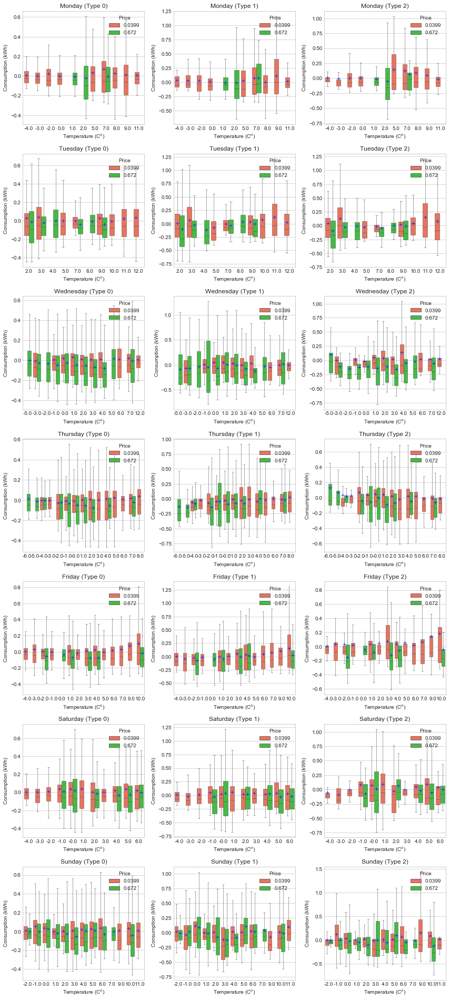

In [18]:
# price comparision
# price responsiveness under different tempertures over days of week and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
weeks = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
for g in range(3): # three types
    for day_of_week in range(7):
        ax_Ntou.append(fig_all.add_subplot(24, 3, 3 * day_of_week + (g + 1)))
        df_day = df_all_res_long[(df_all_res_long['Day of week'] == day_of_week) & (df_all_res_long['Household type'] == g)]
        if df_day.shape[0] >= 1:
            sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_day, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
            ax_Ntou[-1].set_title(weeks[day_of_week]  + ' (Type ' + str(g) + ')' )
            ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
            ax_Ntou[-1].set_ylabel('Consumption (kWh)')
            l = ax_Ntou[-1].legend()
            l.set_title('Price')
            for i,artist in enumerate(ax_Ntou[-1].artists):
                artist.set_linewidth(0.5)
                # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                # Loop over them here, and use the same colour as above
                for j in range(i*6,i*6+6):
                    line = ax_Ntou[-1].lines[j]
                    line.set_linewidth(0.5)    
            ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
plt.tight_layout()

Household type 1 has a wider range of price responsiveness, we could may be focus more on studying of these type of users. 

d) Hour of day - temperature : prices

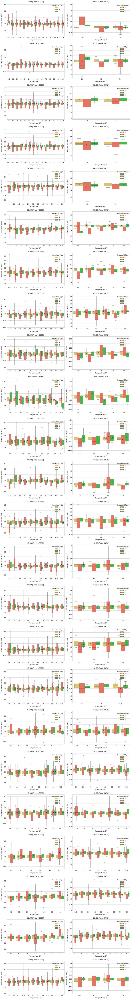

In [106]:
# hourly price responsiveness over temperatures and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
for p in range(2): # two price levels
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 2, 2 * i + (p + 1)))
        df_hour = df_all_res_long[(df_all_res_long['Hour of day'] == i) & (df_all_res_long['Price'] == prices[p])]
#         min_consumption = df_hour['Consumption'].min()
#         max_consumption = df_hour['Consumption'].max()
        if df_hour.shape[0] >= 1:
            sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
            if i < 9:
                ax_Ntou[-1].set_title('0' + str(i) + ':00' + ' (Price ' + str(prices[p]) + ')' )
            else:
                ax_Ntou[-1].set_title(str(i) + ':00' + ' (Price ' + str(prices[p]) + ')' )
            ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
            ax_Ntou[-1].set_ylabel('Consumption (kWh)')
            l = ax_Ntou[-1].legend()
            l.set_title('Household Type')
            for i,artist in enumerate(ax_Ntou[-1].artists):
                artist.set_linewidth(0.5)
                # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                # Loop over them here, and use the same colour as above
                for j in range(i*6,i*6+6):
                    line = ax_Ntou[-1].lines[j]
                    line.set_linewidth(0.5)    
            ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
plt.tight_layout()

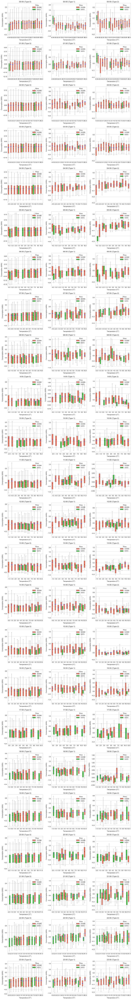

In [141]:
# price comparision
# hourly price responsiveness over temperatures and prices
fig_all = plt.figure(figsize = (12,90))
ax_Ntou = [] # store subplot objects
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
for g in range(3): # three types
    for i in range(24):
        ax_Ntou.append(fig_all.add_subplot(24, 3, 3* i + (g + 1)))
        df_hour = df_all_res_long[(df_all_res_long['Hour of day'] == i) & (df_all_res_long['Household type'] == g)]
#         min_consumption = df_hour['Consumption'].min()
#         max_consumption = df_hour['Consumption'].max()
        if df_hour.shape[0] >= 1:
            sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
            if i < 9:
                ax_Ntou[-1].set_title('0' + str(i) + ':00' + ' (Type ' + str(g) + ')' )
            else:
                ax_Ntou[-1].set_title(str(i) + ':00' + ' (Type ' + str(g) + ')' )
            ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
            ax_Ntou[-1].set_ylabel('Consumption (kWh)')
            l = ax_Ntou[-1].legend()
            l.set_title('Price')
            for i,artist in enumerate(ax_Ntou[-1].artists):
                artist.set_linewidth(0.5)
                # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
                # Loop over them here, and use the same colour as above
                for j in range(i*6,i*6+6):
                    line = ax_Ntou[-1].lines[j]
                    line.set_linewidth(0.5)    
            ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
plt.tight_layout()

When design DR plans, also need to pay attention on the day of weeks effects, otherwise if only use temperature, it could lead to oppositie direction of responsiveness.

See 22:00 low price picture, it's clear that when temperature is higher the reponsiveness to low price increases.

When temperature is low enough, high price won't stop people consume energy

e) Day of week: prices

In [1]:
# price responsiveness under different tempertures over days of week and prices
fig_all = plt.figure(figsize = (12,4))
ax_Ntou = [] # store subplot objects
weeks = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
for p in range(2): # two price levels
    ax_Ntou.append(fig_all.add_subplot(1, 2, (p + 1)))
    df_day = df_all_res_long[df_all_res_long['Price'] == prices[p]]
    if df_day.shape[0] >= 1:
        sns.boxplot(x="Day of week", y="Consumption", hue="Household type", data=df_day, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
        ax_Ntou[-1].set_title('Responsiveness'  + ' (Price ' + str(prices[p]) + ')' )
        ax_Ntou[-1].set_xlabel(r'Day of Week')
        ax_Ntou[-1].set_xticklabels(weeks)
        ax_Ntou[-1].set_ylabel('Consumption (kWh)')
        l = ax_Ntou[-1].legend()
        l.set_title('Household Type')
        for i,artist in enumerate(ax_Ntou[-1].artists):
            artist.set_linewidth(0.5)
            # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
            # Loop over them here, and use the same colour as above
            for j in range(i*6,i*6+6):
                line = ax_Ntou[-1].lines[j]
                line.set_linewidth(0.5)
        ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
plt.tight_layout()

NameError: name 'plt' is not defined

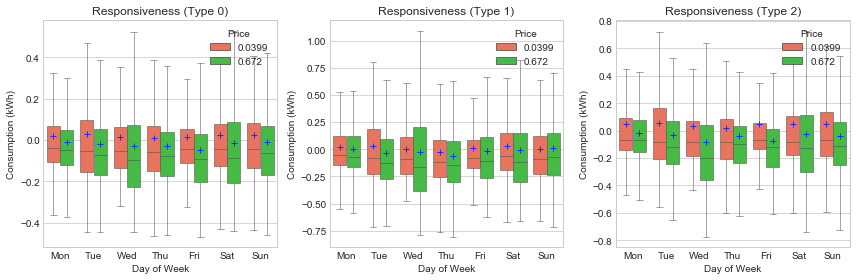

In [19]:
# price comparison
# price responsiveness under different tempertures over days of week and prices
fig_all = plt.figure(figsize = (12,4))
ax_Ntou = [] # store subplot objects
weeks = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
for g in range(3): # three types
    ax_Ntou.append(fig_all.add_subplot(1, 3, (g + 1)))
    df_day = df_all_res_long[df_all_res_long['Household type'] == g]
    if df_day.shape[0] >= 1:
        sns.boxplot(x="Day of week", y="Consumption", hue="Price", data=df_day, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
        ax_Ntou[-1].set_title('Responsiveness'  + ' (Type ' + str(g) + ')' )
        ax_Ntou[-1].set_xlabel(r'Day of Week')
        ax_Ntou[-1].set_xticklabels(weeks)
        ax_Ntou[-1].set_ylabel('Consumption (kWh)')
#         ax_Ntou[-1].set(ylim = (-1.6, 1.6))
        l = ax_Ntou[-1].legend()
        l.set_title('Price')
        for i,artist in enumerate(ax_Ntou[-1].artists):
            artist.set_linewidth(0.5)
            # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
            # Loop over them here, and use the same colour as above
            for j in range(i*6,i*6+6):
                line = ax_Ntou[-1].lines[j]
                line.set_linewidth(0.5)
        ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
plt.tight_layout()

By comparing the median change from 0 in two pictures, we find people are more sensitive to the high price than low price, because in high price the median has obivious drops.

f) Hour of day: prices

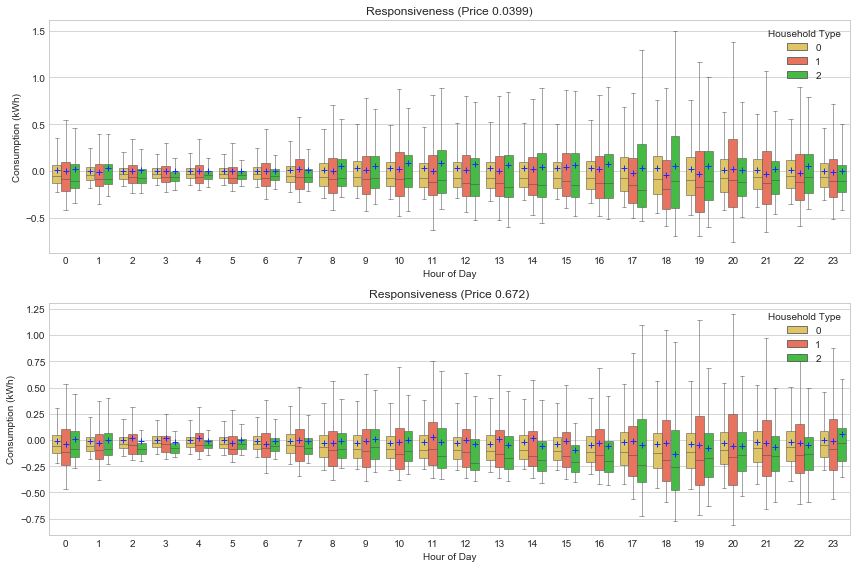

In [20]:
# price responsiveness under different tempertures over days of week and prices
fig_all = plt.figure(figsize = (12,8))
ax_Ntou = [] # store subplot objects
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
for p in range(2): # two price levels
    ax_Ntou.append(fig_all.add_subplot(2, 1, (p + 1)))
    df_hour = df_all_res_long[df_all_res_long['Price'] == prices[p]]
    if df_hour.shape[0] >= 1:
        sns.boxplot(x="Hour of day", y="Consumption", hue="Household type", data=df_hour, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
        ax_Ntou[-1].set_title('Responsiveness'  + ' (Price ' + str(prices[p]) + ')' )
        ax_Ntou[-1].set_xlabel(r'Hour of Day')
        ax_Ntou[-1].set_ylabel('Consumption (kWh)')
        l = ax_Ntou[-1].legend()
#         ax_Ntou[-1].yaxis.grid(True)
#         ax_Ntou[-1].xaxis.grid(True)
        l.set_title('Household Type')
        for i,artist in enumerate(ax_Ntou[-1].artists):
            artist.set_linewidth(0.5)
            # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
            # Loop over them here, and use the same colour as above
            for j in range(i*6,i*6+6):
                line = ax_Ntou[-1].lines[j]
                line.set_linewidth(0.5) 
        ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
plt.tight_layout()

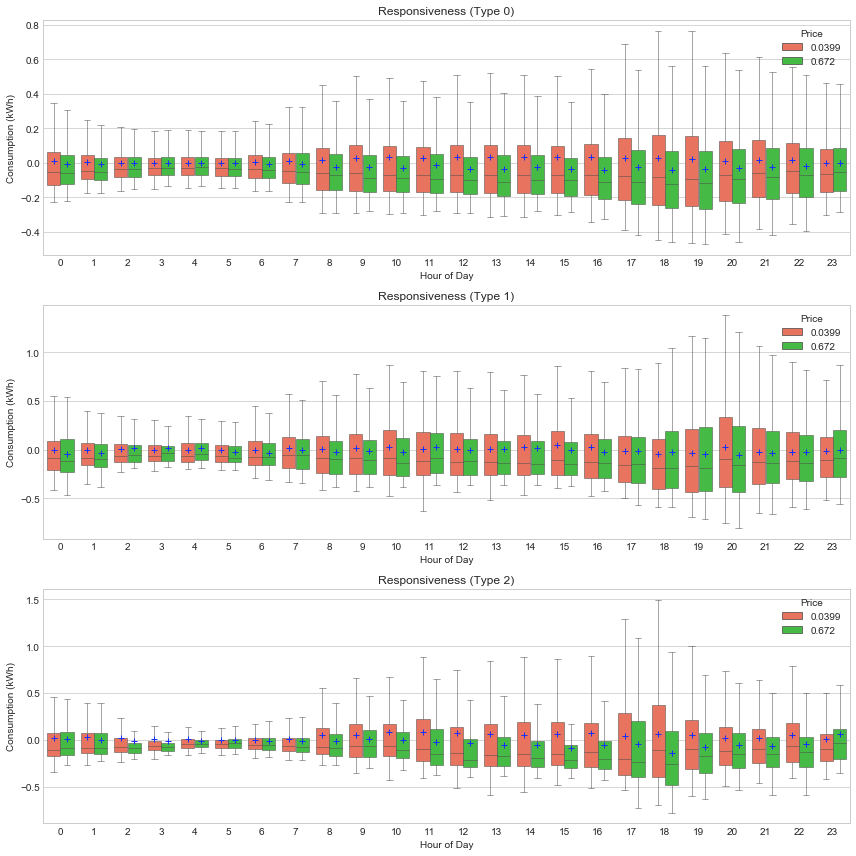

In [21]:
# price comparison
# price responsiveness under different tempertures over days of week and prices
fig_all = plt.figure(figsize = (12,12))
ax_Ntou = [] # store subplot objects
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
for g in range(3): # three types
    ax_Ntou.append(fig_all.add_subplot(3, 1, (g + 1)))
    df_hour = df_all_res_long[df_all_res_long['Household type'] == g]
    if df_hour.shape[0] >= 1:
        sns.boxplot(x="Hour of day", y="Consumption", hue="Price", data=df_hour, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
        ax_Ntou[-1].set_title('Responsiveness'  + ' (Type ' + str(g) + ')' )
        ax_Ntou[-1].set_xlabel(r'Hour of Day')
        ax_Ntou[-1].set_ylabel('Consumption (kWh)')
        l = ax_Ntou[-1].legend()
#         ax_Ntou[-1].yaxis.grid(True)
#         ax_Ntou[-1].xaxis.grid(True)
        l.set_title('Price')
        for i,artist in enumerate(ax_Ntou[-1].artists):
            artist.set_linewidth(0.5)
            # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
            # Loop over them here, and use the same colour as above
            for j in range(i*6,i*6+6):
                line = ax_Ntou[-1].lines[j]
                line.set_linewidth(0.5) 
        ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
plt.tight_layout()

In a day, for low price, the max price responsivenss happens around 1pm (noon) and 8pm (evening); for high price the max responsiveness happens around 1pm and 6-7pm (evening).

Midnight doesn't have too much responsiveness potential. Also high price has more impact on the median behvaior for all household groups

g) Temperature: prices

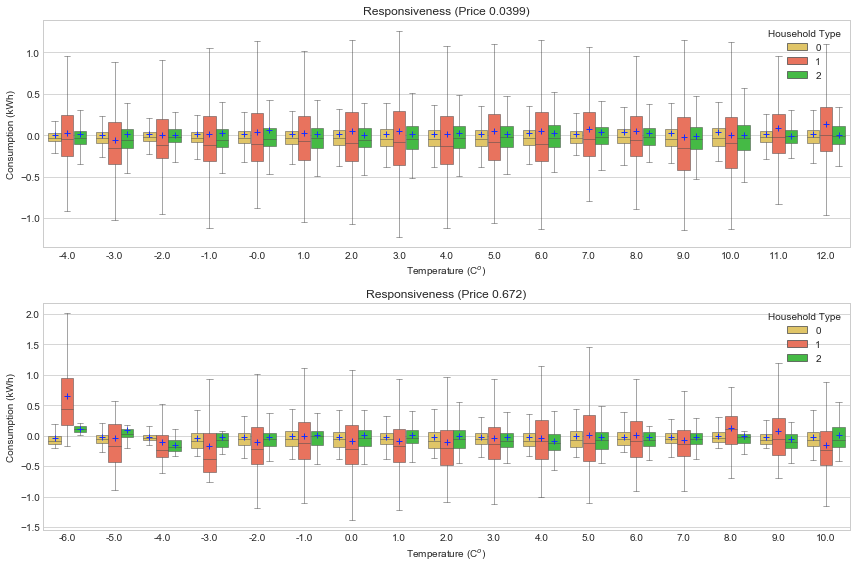

In [109]:
# price responsiveness under different tempertures over days of week and prices
fig_all = plt.figure(figsize = (12,8))
ax_Ntou = [] # store subplot objects
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
for p in range(2): # two price levels
    ax_Ntou.append(fig_all.add_subplot(2, 1, (p + 1)))
    df_temp = df_all_res_long[df_all_res_long['Price'] == prices[p]]
    if df_temp.shape[0] >= 1:
        sns.boxplot(x="TempC", y="Consumption", hue="Household type", data=df_temp, ax=ax_Ntou[-1], palette=['xkcd:maize','tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
        ax_Ntou[-1].set_title('Responsiveness'  + ' (Price ' + str(prices[p]) + ')' )
        ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
        ax_Ntou[-1].set_ylabel('Consumption (kWh)')
#         ax_Ntou[-1].set(ylim = (-1.6, 1.6))
#         ax_Ntou[-1].yaxis.grid(True)
#         ax_Ntou[-1].xaxis.grid(True)
        l = ax_Ntou[-1].legend()
        l.set_title('Household Type')
        for i,artist in enumerate(ax_Ntou[-1].artists):
            artist.set_linewidth(0.5)
            # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
            # Loop over them here, and use the same colour as above
            for j in range(i*6,i*6+6):
                line = ax_Ntou[-1].lines[j]
                line.set_linewidth(0.5)    
        ax_Ntou[-1].legend(loc = 'upper right').set_title('Household Type')
plt.tight_layout()

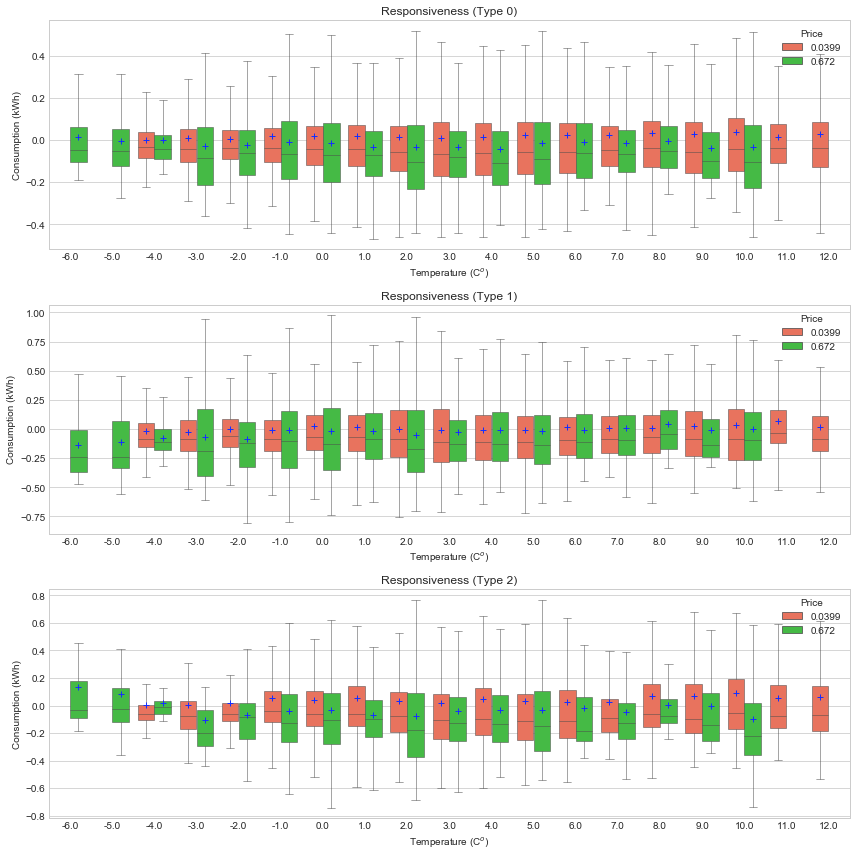

In [22]:
# price comparison
# price responsiveness under different tempertures over days of week and prices
fig_all = plt.figure(figsize = (12,12))
ax_Ntou = [] # store subplot objects
prices = [0.0399, 0.6720]
sns.set_style("whitegrid")
for g in range(3): # three types
    ax_Ntou.append(fig_all.add_subplot(3, 1, (g + 1)))
    df_temp = df_all_res_long[df_all_res_long['Household type'] == g]
    if df_temp.shape[0] >= 1:
        sns.boxplot(x="TempC", y="Consumption", hue="Price", data=df_temp, ax=ax_Ntou[-1], palette=['tomato','limegreen'], showfliers = False, showmeans=True, meanprops={"marker":"+","markerfacecolor":"xkcd:vivid blue", "markeredgecolor":"xkcd:vivid blue"})
        ax_Ntou[-1].set_title('Responsiveness'  + ' (Type ' + str(g) + ')' )
        ax_Ntou[-1].set_xlabel(r'Temperature (C$^o$)')
        ax_Ntou[-1].set_ylabel('Consumption (kWh)')
#         ax_Ntou[-1].set(ylim = (-1.6, 1.6))
#         ax_Ntou[-1].yaxis.grid(True)
#         ax_Ntou[-1].xaxis.grid(True)
        l = ax_Ntou[-1].legend()
        l.set_title('Price')
        for i,artist in enumerate(ax_Ntou[-1].artists):
            artist.set_linewidth(0.5)
            # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
            # Loop over them here, and use the same colour as above
            for j in range(i*6,i*6+6):
                line = ax_Ntou[-1].lines[j]
                line.set_linewidth(0.5)    
        ax_Ntou[-1].legend(loc = 'upper right').set_title('Price')
plt.tight_layout()

Still higher price shows more impacts on behavior's change.
Also, when temperate is lower to -6 celcius degree, the household type 1 increases their energy usage a significant amount no matter the high price. 

Again the last picture verify our point that temperature is a necessary concern of DR plan. See the value when temperature is at -6 degree, without considering the comparision under same temperature level, we probably feel that people won't be affected by the price when they are at lower temperature. But the more accurate understanding should be we don't have similar data for low price with same temperature, so it could be price also play a role under such case, i.e., price may also affect people's behavior under such low temperature, it's just we don't have enough experients and evidence, which doesn't mean we can ignore it or rush to a uncertain conclusion.

### Additional info
Consumption variance of different type of households over 24 hours (Cold Season). 

In [23]:
# type 0 event time consumption prediction
pred_result = []
for i in range(df_type0.shape[0]):
    pred_result.append(predict(df_regression_0, df_type0['Day of week'].iloc[i], df_type0['Hour of day'].iloc[i], df_type0['TempC'].iloc[i]))
df_type0['Predicted consumption'] = pred_result
# price responsiveness elementwise
df_type0_con = df_type0.copy() # store the consumption not the response, just for this additional test
# df_type0_con.iloc[:,1:houseGroupDf.counts.iloc[0] + 1] = df_type0.iloc[:,1:houseGroupDf.counts.iloc[0] + 1].sub(df_type0['Predicted consumption'], axis = 0)

# type 1 event time consumption prediction
pred_result = []
for i in range(df_type1.shape[0]):
    pred_result.append(predict(df_regression_1, df_type1['Day of week'].iloc[i], df_type1['Hour of day'].iloc[i], df_type1['TempC'].iloc[i]))
df_type1['Predicted consumption'] = pred_result

# price responsiveness elementwise
df_type1_con = df_type1.copy()
# df_type1_con.iloc[:,1:houseGroupDf.counts.iloc[1] + 1] = df_type1.iloc[:,1:houseGroupDf.counts.iloc[1] + 1].sub(df_type1['Predicted consumption'], axis = 0)

# type 2 event time consumption prediction
pred_result = []
for i in range(df_type2.shape[0]):
    pred_result.append(predict(df_regression_2, df_type2['Day of week'].iloc[i], df_type2['Hour of day'].iloc[i], df_type2['TempC'].iloc[i]))
df_type2['Predicted consumption'] = pred_result

# price responsiveness elementwise
df_type2_con = df_type2.copy()
# df_type2_con.iloc[:,1:houseGroupDf.counts.iloc[2] + 1] = df_type2.iloc[:,1:houseGroupDf.counts.iloc[2] + 1].sub(df_type2['Predicted consumption'], axis = 0)

In [24]:
df_type0

,GMT,D0000,D0001,D0005,D0007,D0008,D0010,D0012,D0021,D0022,...,D1023,D1024,TempC,TempF,Price,Event_tags,Day of week,Hour of day,Household type,Predicted consumption
0,2013-01-04 14:00:00,0.102,0.239,0.192,0.148,0.234,0.018,0.592,0.032,0.317,...,0.013,0.132,10.333333,51.000000,0.0399,L3,4,14,0,0.268903
1,2013-01-04 15:00:00,0.097,1.016,0.644,0.152,1.056,0.030,1.029,0.077,0.781,...,0.032,0.087,10.000000,51.000000,0.0399,L3,4,15,0,0.269093
2,2013-01-04 16:00:00,1.361,0.314,0.544,0.595,0.825,0.026,0.783,0.053,0.496,...,0.225,0.186,9.333333,49.333333,0.0399,L3,4,16,0,0.305578
3,2013-01-07 23:00:00,0.314,0.344,0.299,0.256,0.418,0.026,0.569,0.710,0.258,...,0.126,0.467,7.000000,44.000000,0.6720,H3,0,23,0,0.280760
4,2013-01-08 00:00:00,0.098,0.229,0.277,0.269,0.447,0.024,0.208,0.093,0.552,...,0.105,0.149,7.000000,44.000000,0.6720,H3,1,0,0,0.211005
5,2013-01-08 01:00:00,0.099,0.167,0.193,0.174,0.110,0.032,0.152,0.011,0.184,...,0.132,0.139,6.666667,43.333333,0.6720,H3,1,1,0,0.173577
6,2013-01-10 02:00:00,0.097,0.121,0.841,0.174,0.173,0.023,0.099,0.089,0.150,...,0.031,0.228,1.333333,34.333333,0.0399,L3,3,2,0,0.146245
7,2013-01-10 03:00:00,0.095,0.114,0.493,0.163,0.102,0.028,0.093,0.031,0.196,...,0.014,0.197,1.000000,34.000000,0.0399,L3,3,3,0,0.137969
8,2013-01-10 04:00:00,0.220,0.074,0.306,0.201,0.108,0.020,0.195,0.031,0.187,...,0.057,0.184,1.000000,34.333333,0.0399,L3,3,4,0,0.138124
9,2013-01-11 11:00:00,0.105,0.199,0.217,0.322,0.128,0.020,0.105,0.011,0.323,...,0.177,0.157,2.666667,36.666667,0.6720,H3,4,11,0,0.279120


In [25]:
# select each user ID and form a seperate dataframe
# first change all the user ID to "Consumption"
new_col = ['GMT']
for i in range(0, houseGroupDf.counts.iloc[0]):
    new_col.append('Consumption')
new_col = new_col + list(df_type0_con.columns)[-8:] # the new column names
df_type0_con.columns = new_col
df_all_con_long = pd.DataFrame()
for i in range(1, houseGroupDf.counts.iloc[0] + 1):
    df_all_con_long = df_all_con_long.append(df_type0_con.iloc[:,[0,i,-8,-7,-6,-5,-4,-3,-2,-1]], ignore_index = True)

new_col = ['GMT']
for i in range(0, houseGroupDf.counts.iloc[1]): # for renaming the second type
    new_col.append('Consumption')
new_col = new_col + list(df_type1_con.columns)[-8:] # the new column names
df_type1_con.columns = new_col
for i in range(1, houseGroupDf.counts.iloc[1] + 1):
    df_all_con_long = df_all_con_long.append(df_type1_con.iloc[:,[0,i,-8,-7,-6,-5,-4,-3,-2,-1]], ignore_index = True)

new_col = ['GMT']
for i in range(0, houseGroupDf.counts.iloc[2]): # for renaming the third type
    new_col.append('Consumption')
new_col = new_col + list(df_type2_con.columns)[-8:] # the new column names
df_type2_con.columns = new_col
for i in range(1, houseGroupDf.counts.iloc[2] + 1):
    df_all_con_long = df_all_con_long.append(df_type2_con.iloc[:,[0,i,-8,-7,-6,-5,-4,-3,-2,-1]], ignore_index = True)

# for clearer visulization, round the temperatures
df_all_con_long['TempC'] = df_all_con_long.TempC.round(0)
df_all_con_long['TempF'] = df_all_con_long.TempF.round(0)
df_all_con_long # ready for the price responsiveness analysis

,GMT,Consumption,TempC,TempF,Price,Event_tags,Day of week,Hour of day,Household type,Predicted consumption
0,2013-01-04 14:00:00,0.102,10.0,51.0,0.0399,L3,4,14,0,0.268903
1,2013-01-04 15:00:00,0.097,10.0,51.0,0.0399,L3,4,15,0,0.269093
2,2013-01-04 16:00:00,1.361,9.0,49.0,0.0399,L3,4,16,0,0.305578
3,2013-01-07 23:00:00,0.314,7.0,44.0,0.6720,H3,0,23,0,0.280760
4,2013-01-08 00:00:00,0.098,7.0,44.0,0.6720,H3,1,0,0,0.211005
5,2013-01-08 01:00:00,0.099,7.0,43.0,0.6720,H3,1,1,0,0.173577
6,2013-01-10 02:00:00,0.097,1.0,34.0,0.0399,L3,3,2,0,0.146245
7,2013-01-10 03:00:00,0.095,1.0,34.0,0.0399,L3,3,3,0,0.137969
8,2013-01-10 04:00:00,0.220,1.0,34.0,0.0399,L3,3,4,0,0.138124
9,2013-01-11 11:00:00,0.105,3.0,37.0,0.6720,H3,4,11,0,0.279120


In [26]:
 # variance of type 0, 1, 2
var_type0_high = []
var_type1_high = []
var_type2_high = []
var_type0_low = []
var_type1_low = []
var_type2_low = []
for i in range(24):
    df_hour_con_long = df_all_con_long[(df_all_con_long['Hour of day'] == i) & (df_all_con_long['Household type'] == 0) & (df_all_con_long['Price'] == 0.6720)]
    var_type0_high.append(df_hour_con_long['Consumption'].std())
    df_hour_con_long = df_all_con_long[(df_all_con_long['Hour of day'] == i) & (df_all_con_long['Household type'] == 0) & (df_all_con_long['Price'] == 0.0399)]
    var_type0_low.append(df_hour_con_long['Consumption'].std())
for i in range(24):
    df_hour_con_long = df_all_con_long[(df_all_con_long['Hour of day'] == i) & (df_all_con_long['Household type'] == 1) & (df_all_con_long['Price'] == 0.6720)]
    var_type1_high.append(df_hour_con_long['Consumption'].std())
    df_hour_con_long = df_all_con_long[(df_all_con_long['Hour of day'] == i) & (df_all_con_long['Household type'] == 1) & (df_all_con_long['Price'] == 0.0399)]
    var_type1_low.append(df_hour_con_long['Consumption'].std())
for i in range(24):
    df_hour_con_long = df_all_con_long[(df_all_con_long['Hour of day'] == i) & (df_all_con_long['Household type'] == 2) & (df_all_con_long['Price'] == 0.6720)]
    var_type2_high.append(df_hour_con_long['Consumption'].std())
    df_hour_con_long = df_all_con_long[(df_all_con_long['Hour of day'] == i) & (df_all_con_long['Household type'] == 2) & (df_all_con_long['Price'] == 0.0399)]
    var_type2_low.append(df_hour_con_long['Consumption'].std())

Now we get the standard deviation of all type housholds in different pricing over 24 hours.

In [27]:
# non-event data
# Type 0 household
# build a new dataframe with columns: GMT, user ids in the group
df_type0_nf = df_tou1h_nf_cold[['GMT'] + list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[0]].House)]
df_type0_nf = pd.merge(df_type0_nf, df_wea1h_nf_cold, on = 'GMT') # add weather
df_type0_nf['Price'] = 0.1176
df_type0_nf['Day of week'] = pd.to_datetime(df_type0_nf.GMT).dt.dayofweek # add day of week
df_type0_nf['Hour of day'] = pd.to_datetime(df_type0_nf.GMT).dt.hour # add hour of day
df_type0_nf['Household type'] = 0

# Type 1 household
# build a new dataframe with columns: GMT, user ids in the group
df_type1_nf = df_tou1h_nf_cold[['GMT'] + list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[1]].House)]
df_type1_nf = pd.merge(df_type1_nf, df_wea1h_nf_cold, on = 'GMT') # add weather
df_type1_nf['Price'] = 0.1176
df_type1_nf['Day of week'] = pd.to_datetime(df_type1_nf.GMT).dt.dayofweek # add day of week
df_type1_nf['Hour of day'] = pd.to_datetime(df_type1_nf.GMT).dt.hour # add hour of day
df_type1_nf['Household type'] = 1

# Type 2 household
# build a new dataframe with columns: GMT, user ids in the group
df_type2_nf = df_tou1h_nf_cold[['GMT'] + list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[2]].House)]
df_type2_nf = pd.merge(df_type2_nf, df_wea1h_nf_cold, on = 'GMT') # add weather
df_type2_nf['Price'] = 0.1176
df_type2_nf['Day of week'] = pd.to_datetime(df_type2_nf.GMT).dt.dayofweek # add day of week
df_type2_nf['Hour of day'] = pd.to_datetime(df_type2_nf.GMT).dt.hour # add hour of day
df_type2_nf['Household type'] = 2

In [28]:
# add dummy column to use code in the next cell
# type 0 event time consumption prediction
df_type0_nf['Predicted consumption'] = 0
# price responsiveness elementwise
df_type0_con_nf = df_type0_nf.copy() # store the consumption not the response, just for this additional test
# df_type0_con.iloc[:,1:houseGroupDf.counts.iloc[0] + 1] = df_type0.iloc[:,1:houseGroupDf.counts.iloc[0] + 1].sub(df_type0['Predicted consumption'], axis = 0)

# type 1 event time consumption prediction
df_type1_nf['Predicted consumption'] = 0
# price responsiveness elementwise
df_type1_con_nf = df_type1_nf.copy()
# df_type1_nf_con.iloc[:,1:houseGroupDf.counts.iloc[1] + 1] = df_type1_nf.iloc[:,1:houseGroupDf.counts.iloc[1] + 1].sub(df_type1_nf['Predicted consumption'], axis = 0)

# type 2 event time consumption prediction
df_type2_nf['Predicted consumption'] = 0
# price responsiveness elementwise
df_type2_con_nf = df_type2_nf.copy()
# df_type2_con.iloc[:,1:houseGroupDf.counts.iloc[2] + 1] = df_type2.iloc[:,1:houseGroupDf.counts.iloc[2] + 1].sub(df_type2['Predicted consumption'], axis = 0)

In [29]:
# select each user ID and form a seperate dataframe
# first change all the user ID to "Consumption"
new_col = ['GMT']
for i in range(0, houseGroupDf.counts.iloc[0]):
    new_col.append('Consumption')
new_col = new_col + list(df_type0_con_nf.columns)[-7:] # the new column names
df_type0_con_nf.columns = new_col
df_all_con_long = pd.DataFrame()
for i in range(1, houseGroupDf.counts.iloc[0] + 1):
    df_all_con_long = df_all_con_long.append(df_type0_con_nf.iloc[:,[0,i,-7,-6,-5,-4,-3,-2,-1]], ignore_index = True)

new_col = ['GMT']
for i in range(0, houseGroupDf.counts.iloc[1]): # for renaming the second type
    new_col.append('Consumption')
new_col = new_col + list(df_type1_con_nf.columns)[-7:] # the new column names
df_type1_con_nf.columns = new_col
for i in range(1, houseGroupDf.counts.iloc[1] + 1):
    df_all_con_long = df_all_con_long.append(df_type1_con_nf.iloc[:,[0,i,-7,-6,-5,-4,-3,-2,-1]], ignore_index = True)

new_col = ['GMT']
for i in range(0, houseGroupDf.counts.iloc[2]): # for renaming the third type
    new_col.append('Consumption')
new_col = new_col + list(df_type2_con_nf.columns)[-7:] # the new column names
df_type2_con_nf.columns = new_col
for i in range(1, houseGroupDf.counts.iloc[2] + 1):
    df_all_con_long = df_all_con_long.append(df_type2_con_nf.iloc[:,[0,i,-7,-6,-5,-4,-3,-2,-1]], ignore_index = True)

# for clearer visulization, round the temperatures
df_all_con_long['TempC'] = df_all_con_long.TempC.round(0)
df_all_con_long['TempF'] = df_all_con_long.TempF.round(0)
df_all_con_long # ready for the price responsiveness analysis

,GMT,Consumption,TempC,TempF,Price,Day of week,Hour of day,Household type,Predicted consumption
0,2013-01-01 00:00:00,1.447,7.0,45.0,0.1176,1,0,0,0
1,2013-01-01 01:00:00,0.336,7.0,44.0,0.1176,1,1,0,0
2,2013-01-01 02:00:00,0.244,6.0,44.0,0.1176,1,2,0,0
3,2013-01-01 03:00:00,0.213,6.0,43.0,0.1176,1,3,0,0
4,2013-01-01 04:00:00,0.210,5.0,41.0,0.1176,1,4,0,0
5,2013-01-01 05:00:00,0.198,5.0,40.0,0.1176,1,5,0,0
6,2013-01-01 06:00:00,0.202,4.0,38.0,0.1176,1,6,0,0
7,2013-01-01 07:00:00,0.167,4.0,38.0,0.1176,1,7,0,0
8,2013-01-01 08:00:00,0.360,3.0,38.0,0.1176,1,8,0,0
9,2013-01-01 09:00:00,0.178,3.0,38.0,0.1176,1,9,0,0


In [30]:
 # variance of type 0, 1, 2
var_type0_default = []
var_type1_default = []
var_type2_default = []
for i in range(24):
    df_hour_con_long = df_all_con_long[(df_all_con_long['Hour of day'] == i) & (df_all_con_long['Household type'] == 0) & (df_all_con_long['Price'] == 0.1176)]
    var_type0_default.append(df_hour_con_long['Consumption'].std())
for i in range(24):
    df_hour_con_long = df_all_con_long[(df_all_con_long['Hour of day'] == i) & (df_all_con_long['Household type'] == 1) & (df_all_con_long['Price'] == 0.1176)]
    var_type1_default.append(df_hour_con_long['Consumption'].std())
for i in range(24):
    df_hour_con_long = df_all_con_long[(df_all_con_long['Hour of day'] == i) & (df_all_con_long['Household type'] == 2) & (df_all_con_long['Price'] == 0.1176)]
    var_type2_default.append(df_hour_con_long['Consumption'].std())

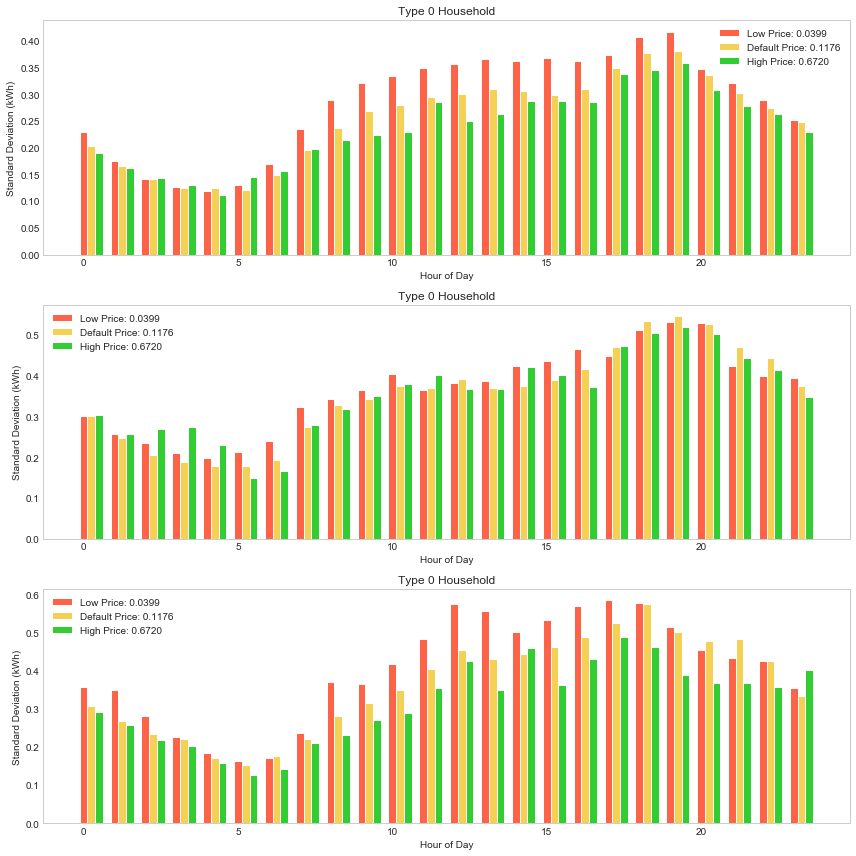

In [31]:
# plot the grouped bar charts based on price, for 3 household types
fig_all = plt.figure(figsize = (12,12))
ax_Ntou = [] # store subplot objects
prices = [0.0399, 0.1176, 0.6720]
# set width of bar
barWidth = 0.25
# Set position of bar on X axis
r1 = np.arange(len(var_type0_high))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
for g in range(3): # three types
    ax_Ntou.append(fig_all.add_subplot(3, 1, (g + 1)))
    # Make the plot
    if g == 0:
        ax_Ntou[-1].bar(r1, var_type0_low, color='tomato', width=barWidth, edgecolor='white', label='Low Price: 0.0399')
        ax_Ntou[-1].bar(r2, var_type0_default, color='xkcd:maize', width=barWidth, edgecolor='white', label='Default Price: 0.1176')
        ax_Ntou[-1].bar(r3, var_type0_high, color='limegreen', width=barWidth, edgecolor='white', label='High Price: 0.6720')
    if g == 1:
        ax_Ntou[-1].bar(r1, var_type1_low, color='tomato', width=barWidth, edgecolor='white', label='Low Price: 0.0399')
        ax_Ntou[-1].bar(r2, var_type1_default, color='xkcd:maize', width=barWidth, edgecolor='white', label='Default Price: 0.1176')
        ax_Ntou[-1].bar(r3, var_type1_high, color='limegreen', width=barWidth, edgecolor='white', label='High Price: 0.6720')
    if g == 2:
        ax_Ntou[-1].bar(r1, var_type2_low, color='tomato', width=barWidth, edgecolor='white', label='Low Price: 0.0399')
        ax_Ntou[-1].bar(r2, var_type2_default, color='xkcd:maize', width=barWidth, edgecolor='white', label='Default Price: 0.1176')
        ax_Ntou[-1].bar(r3, var_type2_high, color='limegreen', width=barWidth, edgecolor='white', label='High Price: 0.6720')
    ax_Ntou[-1].grid()
    ax_Ntou[-1].set_title('Responsiveness'  + ' (Type ' + str(g) + ')' )
    ax_Ntou[-1].set_xlabel('Hour of Day')
    ax_Ntou[-1].set_ylabel('Standard Deviation (kWh)')
    ax_Ntou[-1].legend()
    ax_Ntou[-1].set_title('Type 0 Household')
plt.tight_layout()

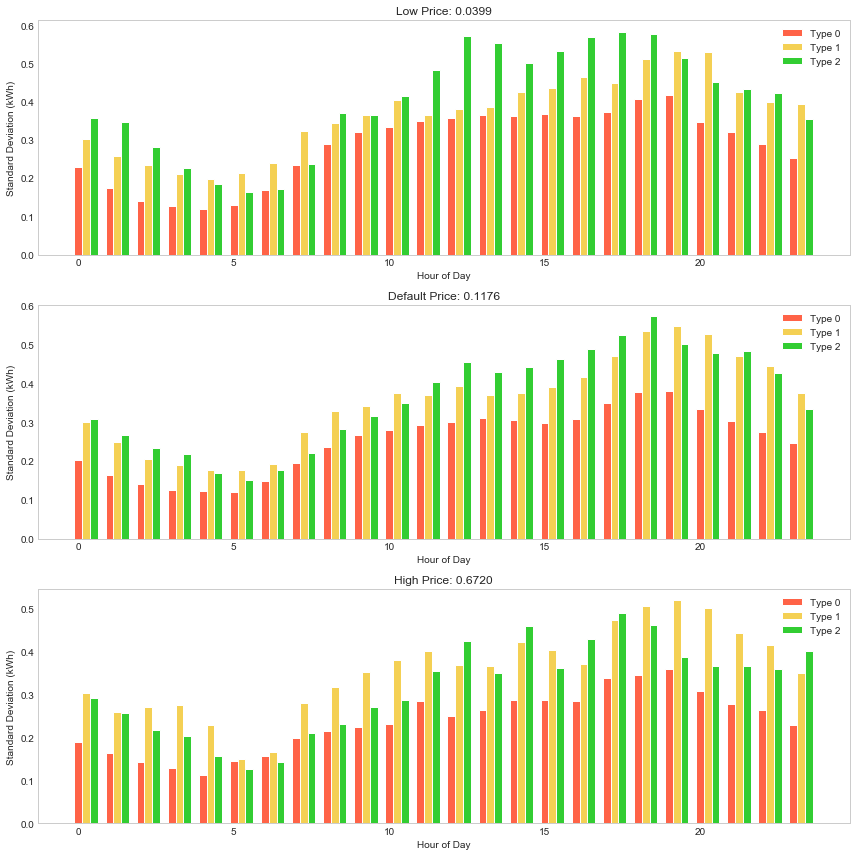

In [32]:
# plot the grouped bar charts based on price, for 3 household types
fig_all = plt.figure(figsize = (12,12))
ax_Ntou = [] # store subplot objects
prices = [0.0399, 0.1176, 0.6720]
# set width of bar
barWidth = 0.25
# Set position of bar on X axis
r1 = np.arange(len(var_type0_high))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
for g in range(3): # three types
    ax_Ntou.append(fig_all.add_subplot(3, 1, (g + 1)))
    # Make the plot
    if g == 0:
        ax_Ntou[-1].bar(r1, var_type0_low, color='tomato', width=barWidth, edgecolor='white', label='Type 0')
        ax_Ntou[-1].bar(r2, var_type1_low, color='xkcd:maize', width=barWidth, edgecolor='white', label='Type 1')
        ax_Ntou[-1].bar(r3, var_type2_low, color='limegreen', width=barWidth, edgecolor='white', label='Type 2')
        ax_Ntou[-1].set_title('Low Price: 0.0399')
    if g == 1:
        ax_Ntou[-1].bar(r1, var_type0_default, color='tomato', width=barWidth, edgecolor='white', label='Type 0')
        ax_Ntou[-1].bar(r2, var_type1_default, color='xkcd:maize', width=barWidth, edgecolor='white', label='Type 1')
        ax_Ntou[-1].bar(r3, var_type2_default, color='limegreen', width=barWidth, edgecolor='white', label='Type 2')
        ax_Ntou[-1].set_title('Default Price: 0.1176')
    if g == 2:
        ax_Ntou[-1].bar(r1, var_type0_high, color='tomato', width=barWidth, edgecolor='white', label='Type 0')
        ax_Ntou[-1].bar(r2, var_type1_high, color='xkcd:maize', width=barWidth, edgecolor='white', label='Type 1')
        ax_Ntou[-1].bar(r3, var_type2_high, color='limegreen', width=barWidth, edgecolor='white', label='Type 2')
        ax_Ntou[-1].set_title('High Price: 0.6720')
    ax_Ntou[-1].grid()
    ax_Ntou[-1].set_xlabel('Hour of Day')
    ax_Ntou[-1].set_ylabel('Standard Deviation (kWh)')
    ax_Ntou[-1].legend()
plt.tight_layout()